In [ ]:
%matplotlib inline  

In [ ]:
# NumPy
#import numpy as np
#from scipy.signal import convolve2d

# JAX
import jax.numpy as np
from jax.scipy.signal import convolve2d

# The rest
from matplotlib import pyplot as plt
from skimage.io import imread, imsave
from skimage.util import img_as_float32, img_as_ubyte, random_noise

In [ ]:
img = imread('The_Cat.jpg')

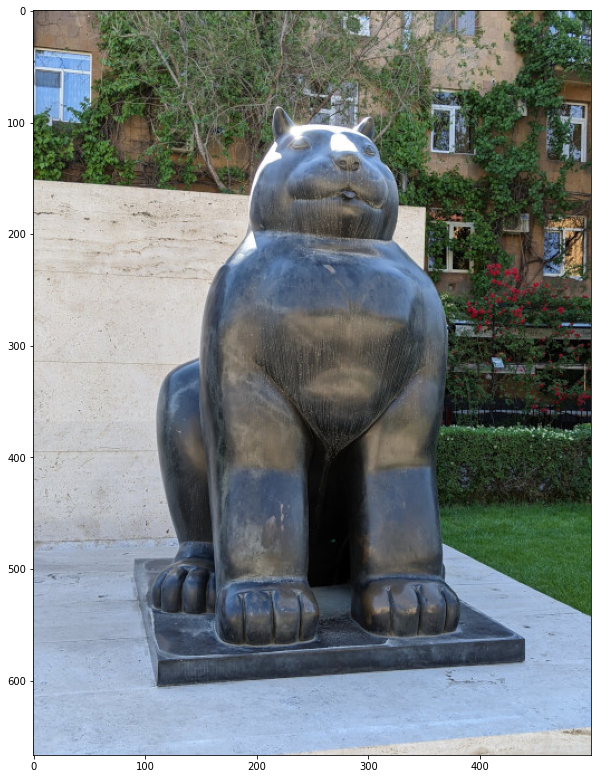

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(img)

In [ ]:
type(img)

numpy.ndarray

In [ ]:
img = np.asarray(img)

In [ ]:
type(img)

jaxlib.xla_extension.DeviceArray

In [ ]:
img.shape

(667, 500, 3)

In [ ]:
img.dtype

dtype('uint8')

In [ ]:
img.size

1000500

In [ ]:
img.ndim

3

In [ ]:
img.nbytes

1000500

In [ ]:
ca = img.astype(np.float32)

In [ ]:
ca.nbytes

4002000

In [ ]:
ca.size

1000500

In [ ]:
cat_face = img[80:220, 190:330, 1]

In [ ]:
cat_face.shape

(140, 140)

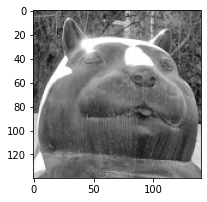

In [ ]:
plt.figure(figsize = (3,4))
plt.imshow(cat_face, cmap='gray')

In [ ]:
img.min(), img.max()

(DeviceArray(0, dtype=uint8), DeviceArray(255, dtype=uint8))

In [ ]:
# https://scikit-image.org/docs/stable/user_guide/data_types.html
# 
img = img_as_float32(img)

In [ ]:
img.dtype

dtype('float32')

In [ ]:
img.min(), img.max()

(0.0, 1.0)

In [ ]:
img = img[:,::-1,:] # or can use flip() https://numpy.org/doc/stable/reference/generated/numpy.flip.html

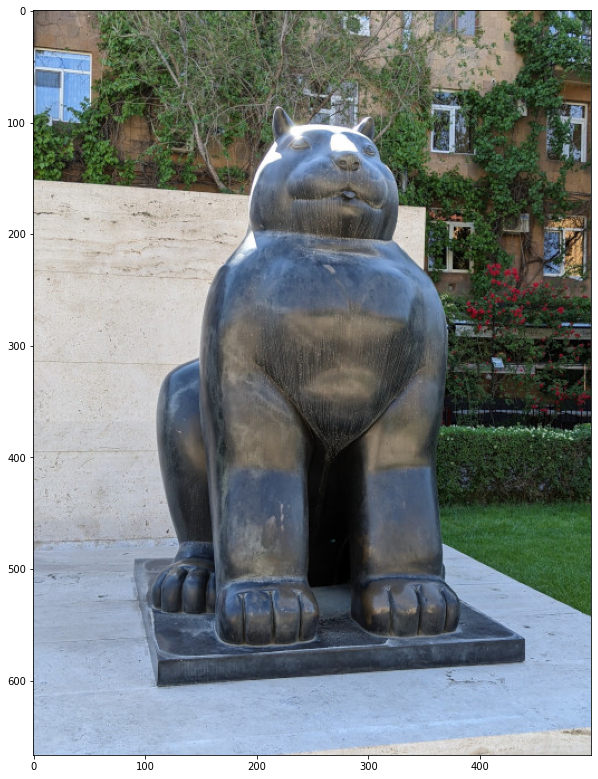

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(img)

In [ ]:
# https://scikit-image.org/docs/stable/api/skimage.util.html#random-noise
img_noised = random_noise(img, mode='gaussian')

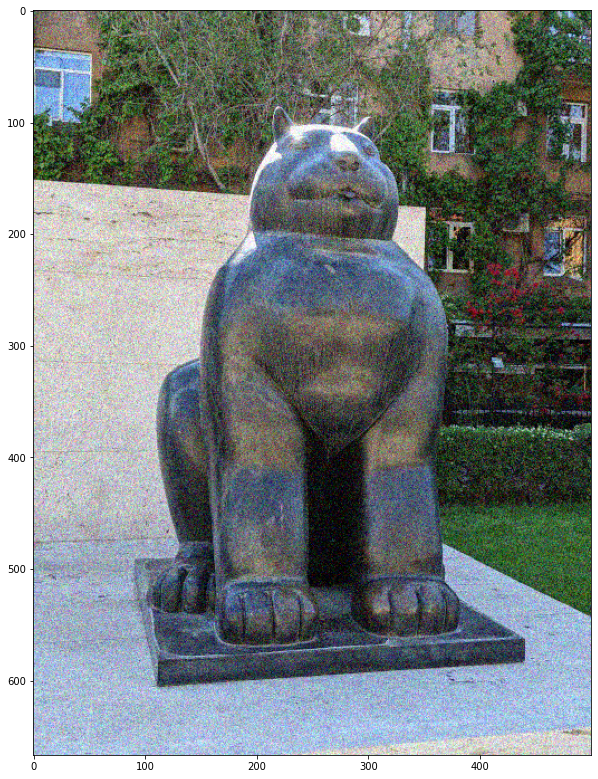

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(img_noised)

In [ ]:
# python s&p https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv
# https://gist.github.com/Prasad9/28f6a2df8e8d463c6ddd040f4f6a028a
img_noised = random_noise(img, mode='s&p', amount=0.1)

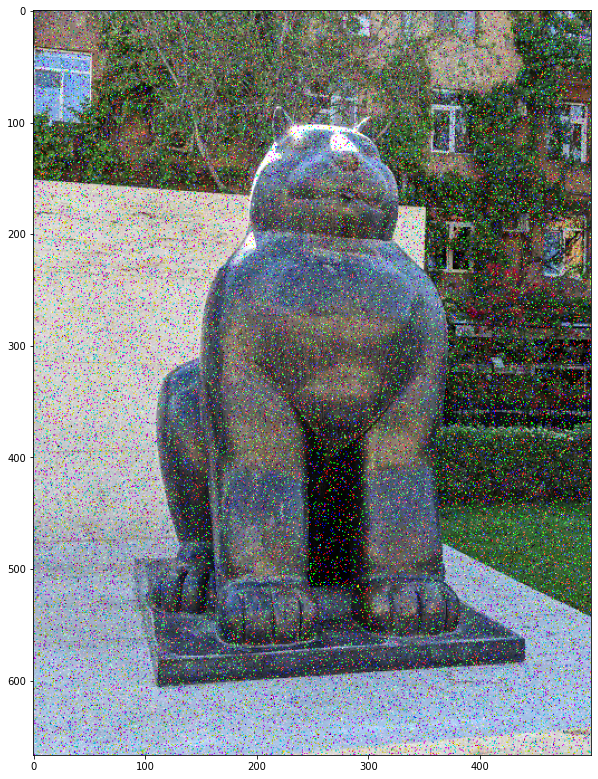

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(img_noised)

In [ ]:
# https://numpy.org/doc/stable/reference/generated/numpy.rot90.html
#img = np.rot90(img, k=2, axes=(0, 1)) 

In [ ]:
# some links
# https://songhuiming.github.io/pages/2017/04/16/convolve-correlate-and-image-process-in-numpy/
# https://docs.gimp.org/2.6/en/plug-in-convmatrix.html

In [ ]:
kernel_blur = np.ones((5,5))
kernel_blur /= np.sum(kernel_blur)

In [ ]:
kernel_blur

DeviceArray([[0.04, 0.04, 0.04, 0.04, 0.04],
             [0.04, 0.04, 0.04, 0.04, 0.04],
             [0.04, 0.04, 0.04, 0.04, 0.04],
             [0.04, 0.04, 0.04, 0.04, 0.04],
             [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [ ]:
# https://github.com/TheAlgorithms/Python/blob/master/digital_image_processing/filters/gaussian_filter.py
# https://stackoverflow.com/questions/17190649/how-to-obtain-a-gaussian-filter-in-python
# https://en.wikipedia.org/wiki/Gaussian_blur

def gaussian_kernel(kernel_size, sigma=1.0, mu=0.0):
    center = kernel_size // 2
    x, y = np.mgrid[-center : kernel_size - center, -center : kernel_size - center]
    d = np.sqrt(np.square(x) + np.square(y))
    koeff = 1 / (2 * np.pi * np.square(sigma))
    kernel = koeff * np.exp(-np.square(d-mu) / (2 * np.square(sigma)))
    return kernel

In [ ]:
kernel_gauss = gaussian_kernel(5)
kernel_gauss

DeviceArray([[0.00291502, 0.01306424, 0.02153928, 0.01306424, 0.00291502],
             [0.01306424, 0.05854984, 0.09653235, 0.05854984, 0.01306424],
             [0.02153928, 0.09653235, 0.15915494, 0.09653235, 0.02153928],
             [0.01306424, 0.05854984, 0.09653235, 0.05854984, 0.01306424],
             [0.00291502, 0.01306424, 0.02153928, 0.01306424, 0.00291502]],            dtype=float32)

In [ ]:
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html#scipy.signal.convolve2d

In [ ]:
def color_convolution(image, kernel):
  channels = []
  for i in range(3):
    color_channel = image[:,:,i]
    filtered_channel = convolve2d(color_channel, kernel, mode="same") #, boundary="symm")
    filtered_channel = np.clip(filtered_channel, 0.0, 1.0)
    channels.append(filtered_channel)
  final_image = np.stack(channels, axis=2) #.astype('uint8')
  return final_image

In [ ]:
img_blur = color_convolution(img_noised, kernel_gauss)

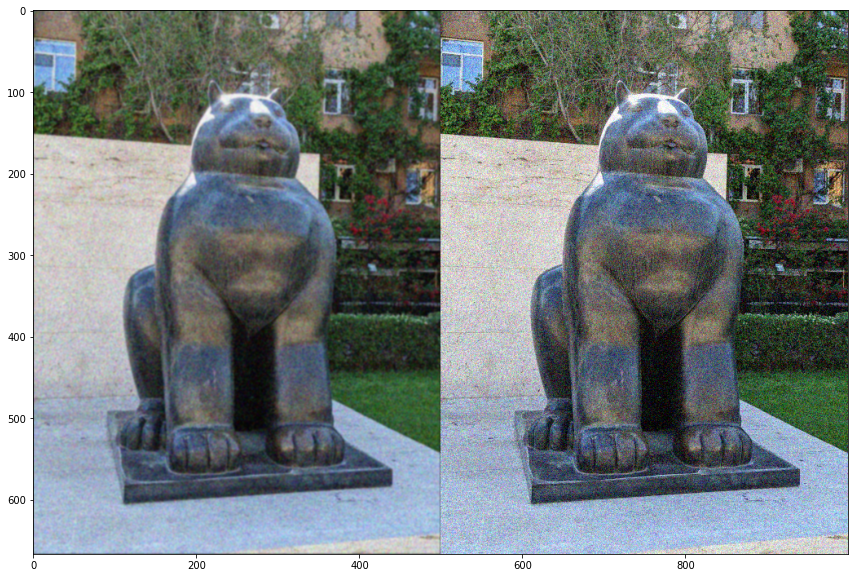

In [ ]:
plt.figure(figsize = (20,10))
plt.imshow(np.hstack((img_blur, img_noised)))

In [ ]:
# https://eeweb.engineering.nyu.edu/~yao/EE3414/image_filtering.pdf
# https://songhuiming.github.io/pages/2017/04/16/convolve-correlate-and-image-process-in-numpy/
# https://docs.gimp.org/2.6/en/plug-in-convmatrix.html

In [ ]:
kernel_sharpen = np.array(
    [[-1, -1, -1, -1, -1],
     [-1, -1, -1, -1, -1],
     [-1, -1, 50, -1, -1],
     [-1, -1, -1, -1, -1],
     [-1, -1, -1, -1, -1]], dtype=np.float32
)
kernel_sharpen /= np.sum(kernel_sharpen)

In [ ]:
kernel_sharpen = np.array(
    [[-1,-1,-1],
     [-1,16,-1],
     [-1,-1,-1]], dtype=np.float32
)
kernel_sharpen /= np.sum(kernel_sharpen)

In [ ]:
kernel_sharpen

DeviceArray([[-0.03846154, -0.03846154, -0.03846154, -0.03846154,
              -0.03846154],
             [-0.03846154, -0.03846154, -0.03846154, -0.03846154,
              -0.03846154],
             [-0.03846154, -0.03846154,  1.923077  , -0.03846154,
              -0.03846154],
             [-0.03846154, -0.03846154, -0.03846154, -0.03846154,
              -0.03846154],
             [-0.03846154, -0.03846154, -0.03846154, -0.03846154,
              -0.03846154]], dtype=float32)

In [ ]:
img_restored = color_convolution(img_blur, kernel_sharpen)

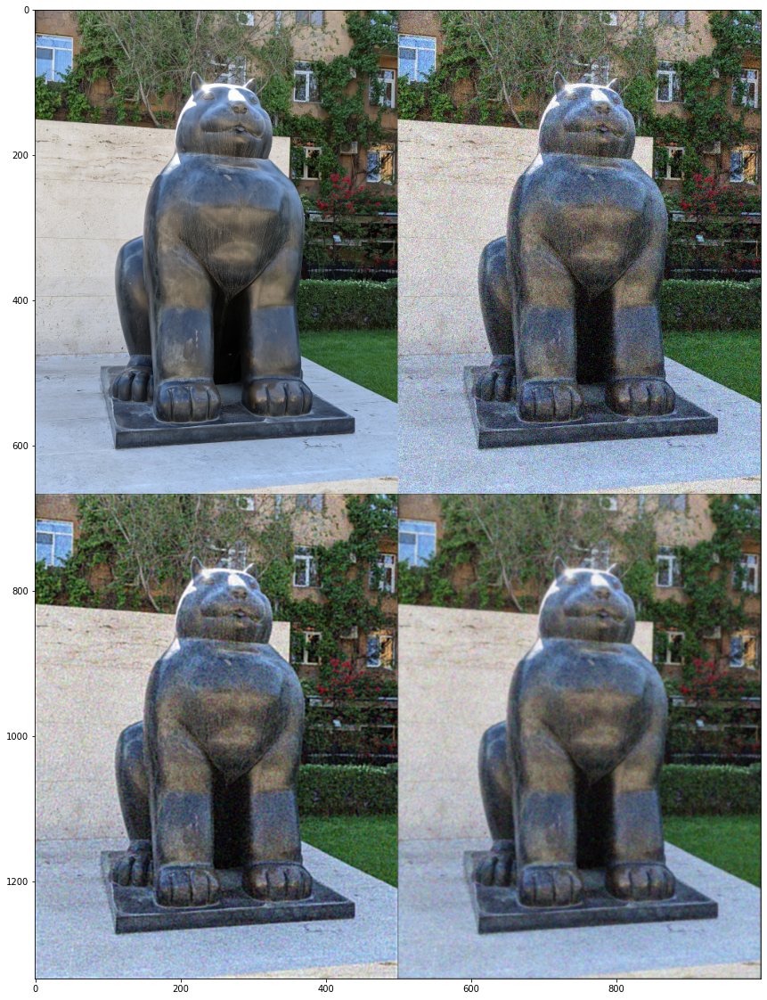

In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(np.vstack(
    (np.hstack((img, img_noised)),
    np.hstack((img_restored, img_blur)))
))

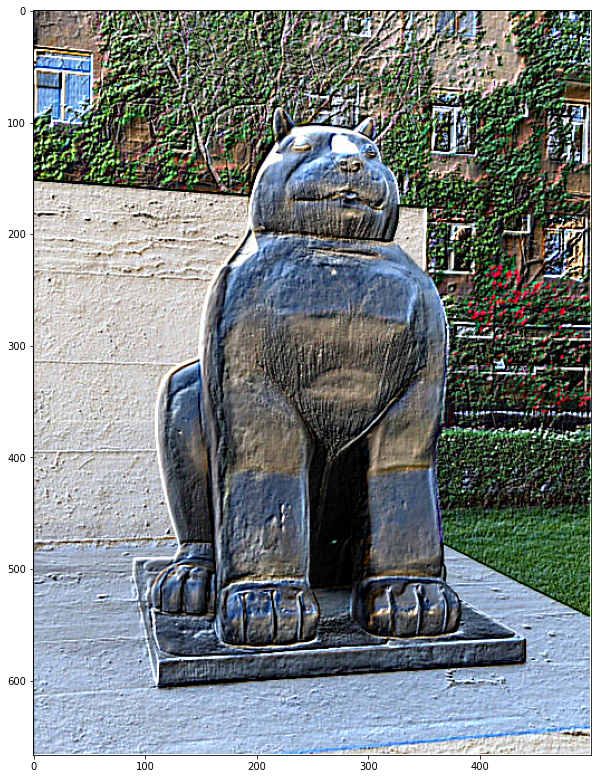

In [ ]:
kernel_emboss = np.array(
    [[-2,-1, 0],
     [-1, 1, 1],
     [0,  1, 2]]
)
img_emboss = color_convolution(img, kernel_emboss)
plt.figure(figsize = (10,20))
plt.imshow(img_emboss)

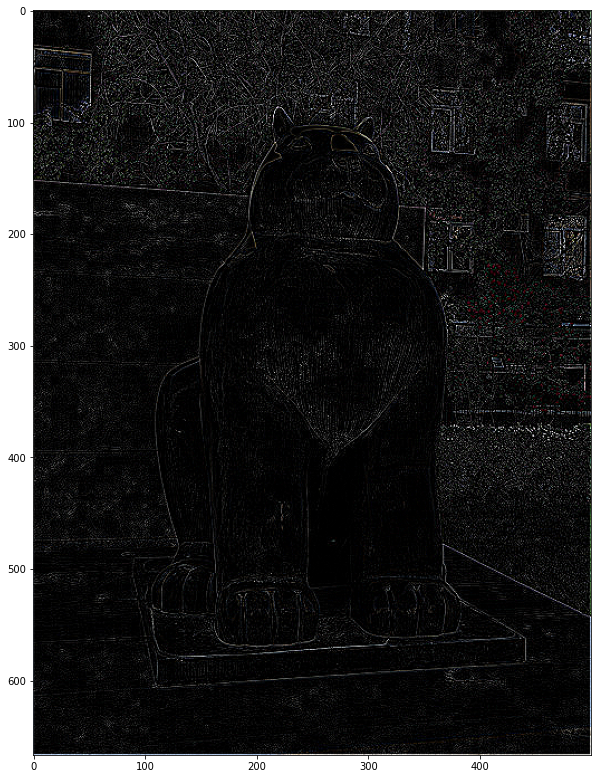

In [ ]:
kernel_edge = np.array(
    [[0,-1,0],
     [-1,4,-1],
     [0,-1,0]], dtype=np.float32
)
img_edge = color_convolution(img, kernel_edge)
plt.figure(figsize = (10,20))
plt.imshow(img_edge)

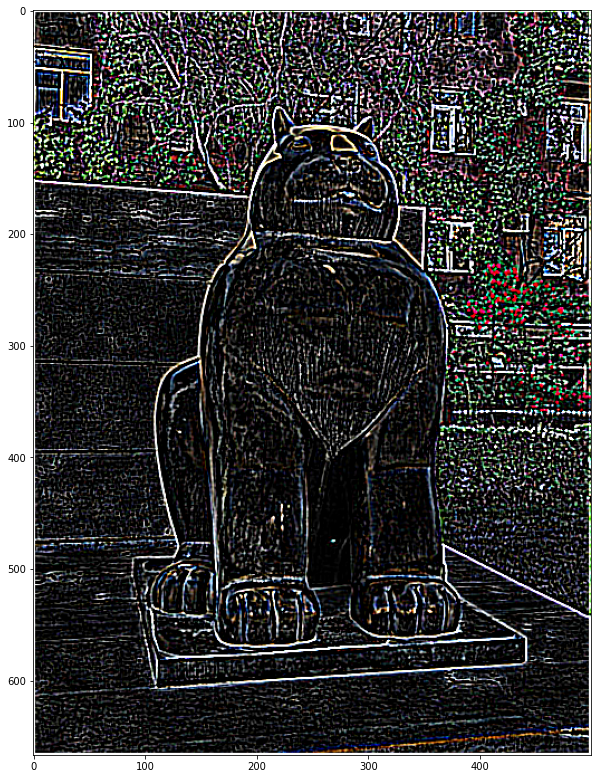

In [ ]:
kernel_custom = np.array(
    [[-1, -1, -1, -1, -1],
    [-1,  1,  2,  1, -1],
    [-1,  2,  4,  2, -1],
    [-1,  1,  2,  1, -1],
    [-1, -1, -1, -1, -1]]
)
img_edge = color_convolution(img, kernel_custom)
plt.figure(figsize = (10,20))
plt.imshow(img_edge)

In [ ]:
img_edge.shape

(667, 500, 3)

In [ ]:
img_edge

DeviceArray([[[1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ],
              ...,
              [0.6156862 , 0.984314  , 0.49019614],
              [1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ]],

             [[1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ],
              ...,
              [0.47843125, 1.        , 0.35294124],
              [1.        , 1.        , 1.        ],
              [1.        , 1.        , 1.        ]],

             [[0.83529425, 0.8       , 0.76078427],
              [1.        , 1.        , 1.        ],
              [0.29411763, 0.29019615, 0.3176467 ],
              ...,
              [0.        , 0.        , 0.        ],
              [0.90588236, 1.        , 0.84705865],
              [1.        , 1.        , 1.        ]],

 

In [ ]:
image_modified = img_as_ubyte(img_edge)

In [ ]:
imsave('The_Cat_modified.jpg', arr=image_modified)

In [ ]:
image_modified

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [157, 251, 125],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [122, 255,  90],
        [255, 255, 255],
        [255, 255, 255]],

       [[213, 204, 194],
        [255, 255, 255],
        [ 75,  74,  81],
        ...,
        [  0,   0,   0],
        [231, 255, 216],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]